#Lab 1: Sampling and Reconstruction of Speech Signals

## Aim
To study sampling and reconstruction of speech signals at different sampling rates, evaluate reconstruction using zero-order hold and linear interpolation, and analyze the effect on speech quality.

## Tasks
1. Implement sampling and quantization techniques for the given speech signals.  
2. Plot the time domain representation of the original speech signal.  
3. Sample the speech signal at 8kHz, 16kHz, and 44.1kHz.  
4. Reconstruct using:
   - Zero-order Hold (ZOH)  
   - Linear Interpolation  
5. Compute Mean Squared Error (MSE) for both methods.  
6. Listen to original, sampled, and reconstructed audios.  
7. Write an inference on how sampling rates affect speech quality.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.interpolate import interp1d
from sklearn.metrics import mean_squared_error
from IPython.display import Audio, display

In [ ]:
def plot_signal(time, signal, title, xlabel="Time (s)", ylabel="Amplitude"):
    plt.figure(figsize=(10, 4))
    plt.plot(time, signal)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def zero_order_hold(original_time, sampled_time, sampled_signal):
    zoh = interp1d(sampled_time, sampled_signal, kind='nearest', fill_value="extrapolate")
    return zoh(original_time)

def linear_interpolation(original_time, sampled_time, sampled_signal):
    lin = interp1d(sampled_time, sampled_signal, kind='linear', fill_value="extrapolate")
    return lin(original_time)

def play_audio(signal, sr, title="Audio Playback"):
    print(f"▶️ {title} at {sr} Hz")
    return Audio(signal, rate=sr)

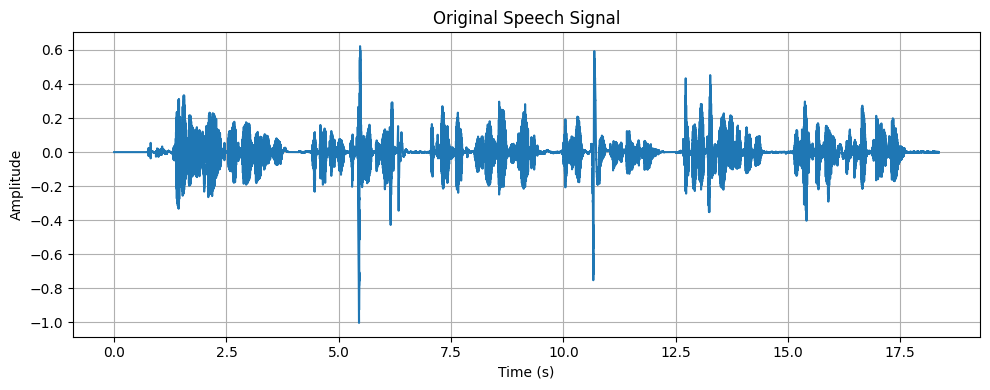

▶️ Original Speech at 44100 Hz


In [ ]:
# Load speech signal (replace with your speech.wav file)
fs, speech = wavfile.read("/content/mono.wav")

# Normalize
speech = speech.astype(float) / np.max(np.abs(speech))

# Time axis
duration = len(speech) / fs
time = np.linspace(0, duration, len(speech))

# Plot original
plot_signal(time, speech, "Original Speech Signal")

# Play original
display(play_audio(speech, fs, "Original Speech"))

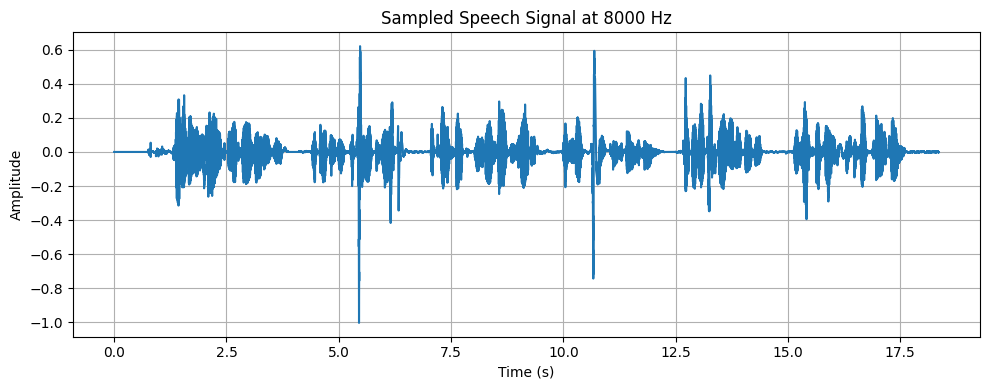

▶️ Sampled Speech 8000 Hz at 8000 Hz


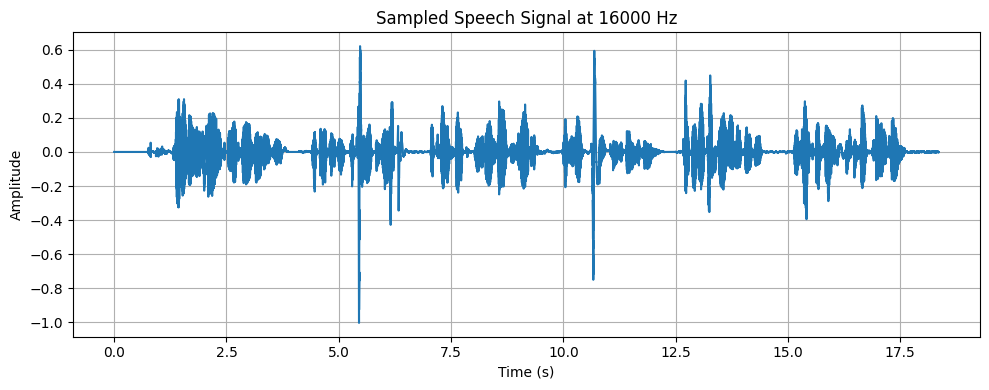

▶️ Sampled Speech 16000 Hz at 16000 Hz


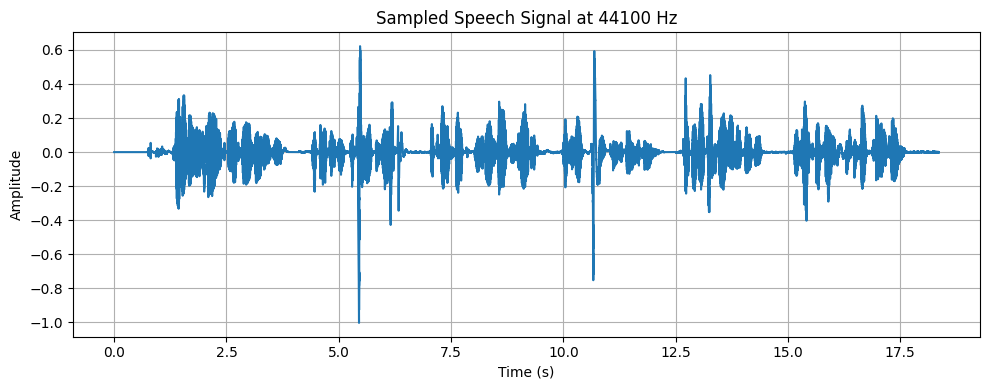

▶️ Sampled Speech 44100 Hz at 44100 Hz


In [ ]:
sampling_rates = [8000, 16000, 44100]

for sr in sampling_rates:
    step = int(fs / sr)
    sampled_signal = speech[::step]
    sampled_time = time[::step]

    # Plot sampled
    plot_signal(sampled_time, sampled_signal, f"Sampled Speech Signal at {sr} Hz")

    # Play sampled
    display(play_audio(sampled_signal, sr, f"Sampled Speech {sr} Hz"))


Sampling Rate: 8000 Hz
MSE (Zero-order Hold): 0.000126
MSE (Linear Interpolation): 0.000101


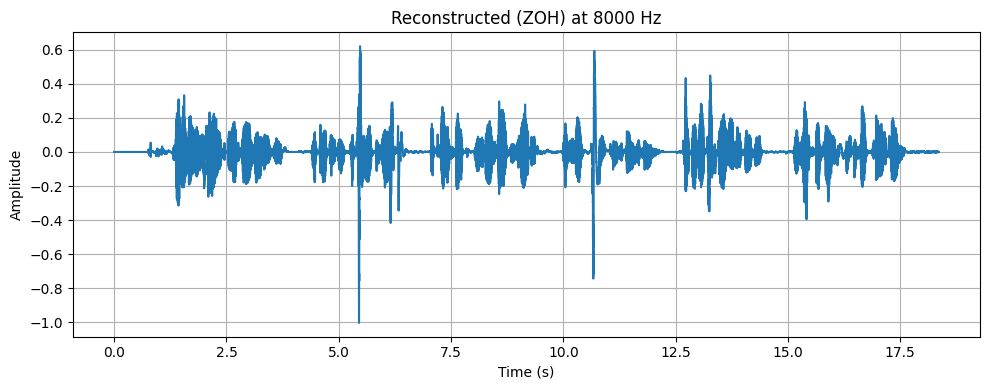

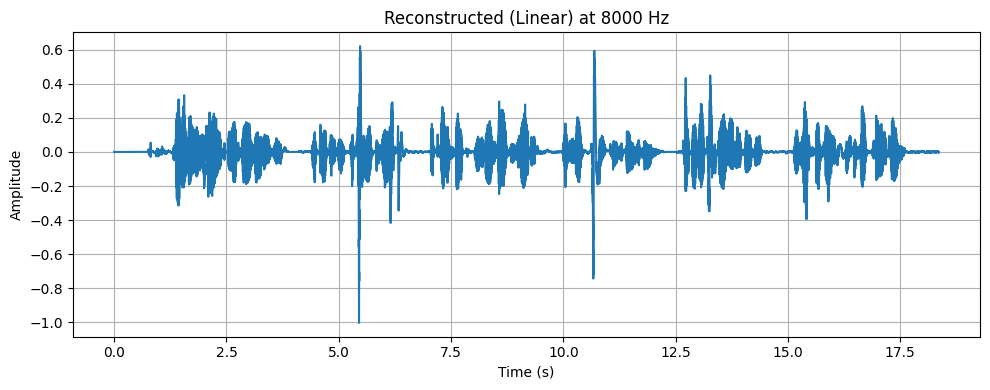

▶️ Reconstructed (ZOH) 8000 Hz at 44100 Hz


▶️ Reconstructed (Linear) 8000 Hz at 44100 Hz



Sampling Rate: 16000 Hz
MSE (Zero-order Hold): 0.000037
MSE (Linear Interpolation): 0.000007


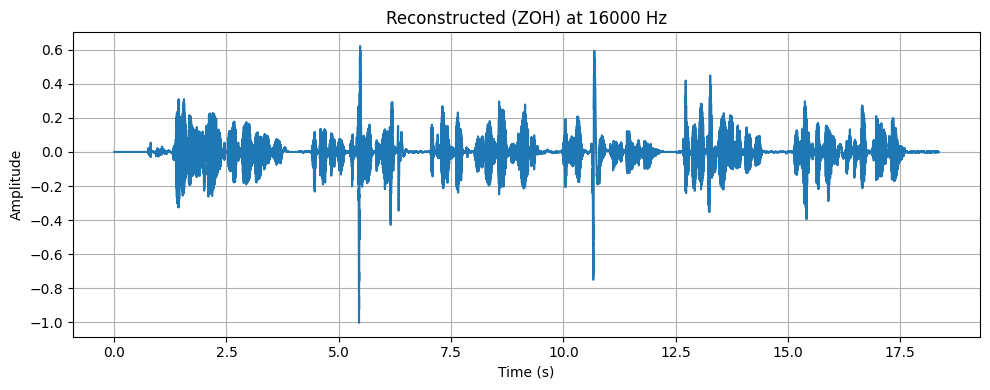

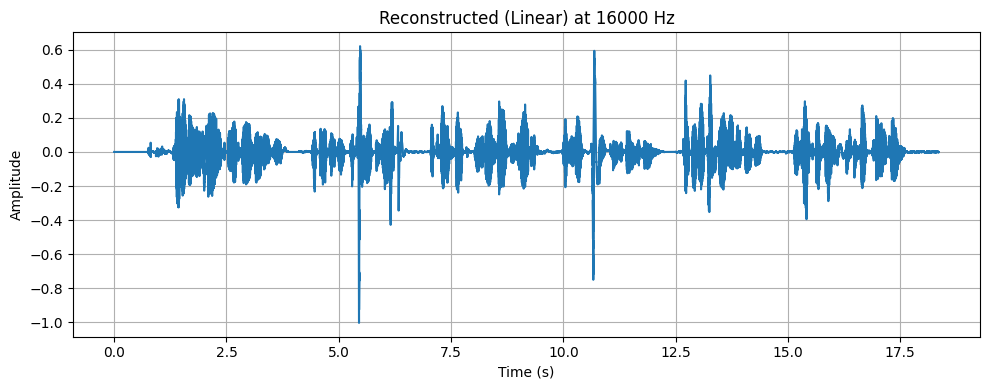

▶️ Reconstructed (ZOH) 16000 Hz at 44100 Hz


▶️ Reconstructed (Linear) 16000 Hz at 44100 Hz



Sampling Rate: 44100 Hz
MSE (Zero-order Hold): 0.000000
MSE (Linear Interpolation): 0.000000


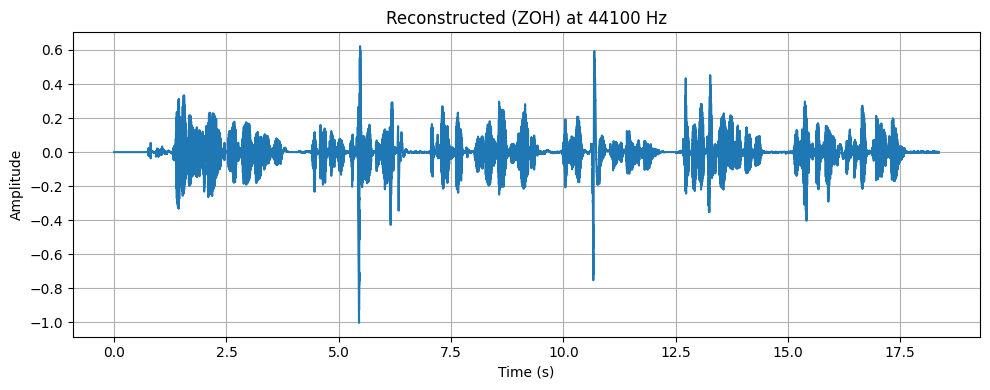

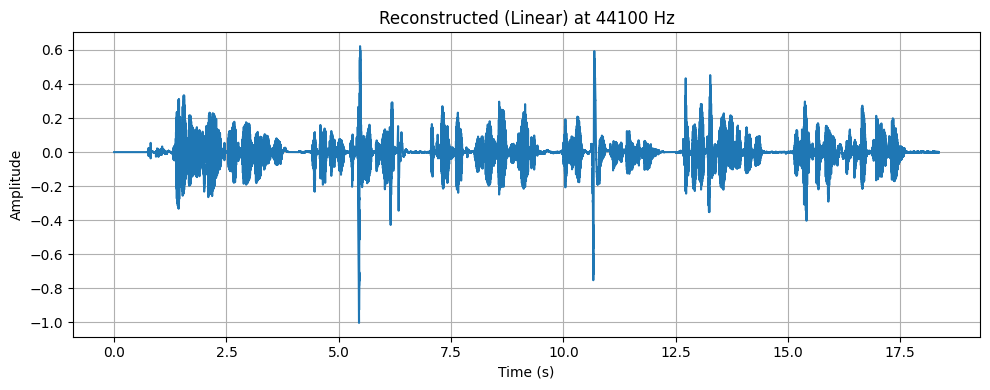

▶️ Reconstructed (ZOH) 44100 Hz at 44100 Hz


▶️ Reconstructed (Linear) 44100 Hz at 44100 Hz


In [ ]:
for sr in sampling_rates:
    step = int(fs / sr)
    sampled_signal = speech[::step]
    sampled_time = time[::step]

    # Reconstruct
    zoh_reconstructed = zero_order_hold(time, sampled_time, sampled_signal)
    lin_reconstructed = linear_interpolation(time, sampled_time, sampled_signal)

    # Compute errors
    mse_zoh = mean_squared_error(speech, zoh_reconstructed)
    mse_lin = mean_squared_error(speech, lin_reconstructed)

    print(f"\nSampling Rate: {sr} Hz")
    print(f"MSE (Zero-order Hold): {mse_zoh:.6f}")
    print(f"MSE (Linear Interpolation): {mse_lin:.6f}")

    # Plot reconstructed
    plot_signal(time, zoh_reconstructed, f"Reconstructed (ZOH) at {sr} Hz")
    plot_signal(time, lin_reconstructed, f"Reconstructed (Linear) at {sr} Hz")

    # Play reconstructed audios
    display(play_audio(zoh_reconstructed, fs, f"Reconstructed (ZOH) {sr} Hz"))
    display(play_audio(lin_reconstructed, fs, f"Reconstructed (Linear) {sr} Hz"))

#Lab 1 (Part 2): Source-Filter Model of Speech Signals

## Aim
To implement the Source-Filter model of speech production and analyze the impact of sampling and reconstruction on the quality of speech signals.

## Tasks
1. Generate a synthetic speech signal using the Source-Filter model.
   - Source: Glottal pulse train (voiced) or White noise (unvoiced).
   - Filter: Vocal tract filter modeled with formants.
2. Plot the generated speech signal and analyze filtering effects.
3. Sample the speech signal at 8 kHz, 16 kHz, and 44.1 kHz.
4. Reconstruct using interpolation (ZOH, Linear).
5. Compute MSE between original and reconstructed signals.
6. Write inference on the effect of source-filter modeling, sampling, and reconstruction.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import lfilter
from sklearn.metrics import mean_squared_error
from IPython.display import Audio, display

# Plot function with color and aesthetic improvements
def plot_signal(time, signal, title, color='b', label=None):
    plt.figure(figsize=(10, 4))
    plt.plot(time, signal, color=color, linewidth=1.5, label=label)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude")
    plt.grid(True, linestyle='--', alpha=0.6)
    if label:
        plt.legend()
    plt.show()

# Audio playback helper
def play_audio(signal, fs, label="Audio"):
    return Audio(signal, rate=fs, autoplay=False)

# Zero-order hold reconstruction
def zero_order_hold(original_time, sampled_time, sampled_signal):
    zoh = np.zeros(len(original_time))
    for i in range(len(sampled_time)-1):
        zoh[(original_time >= sampled_time[i]) & (original_time < sampled_time[i+1])] = sampled_signal[i]
    zoh[original_time >= sampled_time[-1]] = sampled_signal[-1]
    return zoh

# Linear interpolation reconstruction
def linear_interpolation(original_time, sampled_time, sampled_signal):
    return np.interp(original_time, sampled_time, sampled_signal)

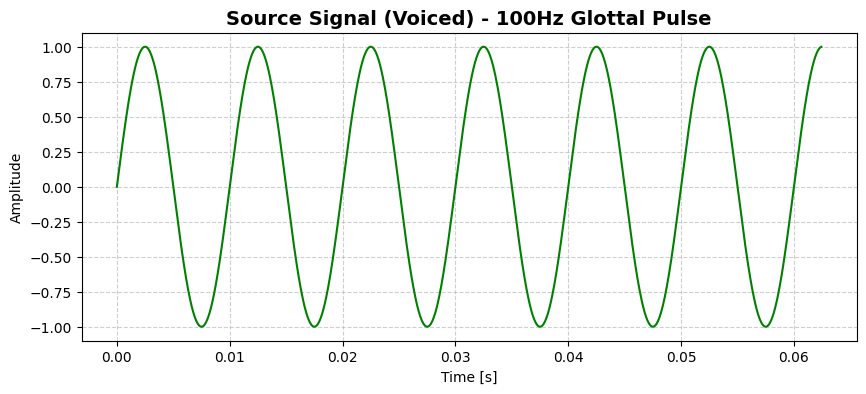

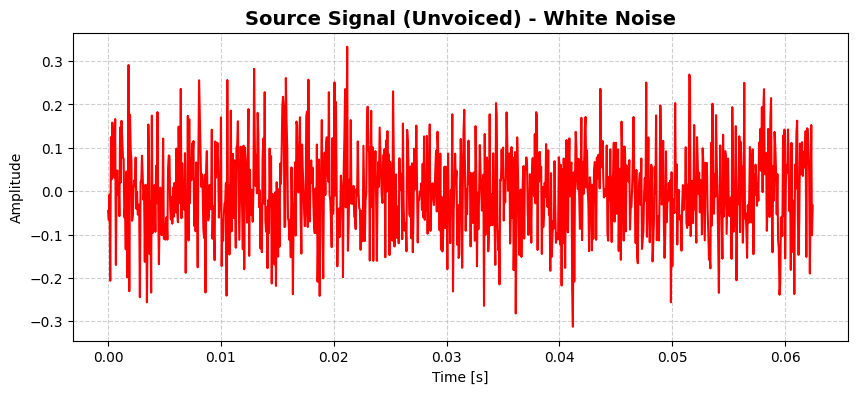

In [ ]:
fs = 16000  # Original sampling frequency
duration = 1.0
t = np.linspace(0, duration, int(fs*duration), endpoint=False)

# Choose voiced (glottal pulse train) or unvoiced (white noise)
f0 = 100  # fundamental frequency for voiced
source_voiced = np.sin(2 * np.pi * f0 * t)  # synthetic glottal-like pulse
source_unvoiced = np.random.randn(len(t)) * 0.1  # noise for unvoiced

plot_signal(t[:1000], source_voiced[:1000], "Source Signal (Voiced) - 100Hz Glottal Pulse", color='green')
plot_signal(t[:1000], source_unvoiced[:1000], "Source Signal (Unvoiced) - White Noise", color='red')

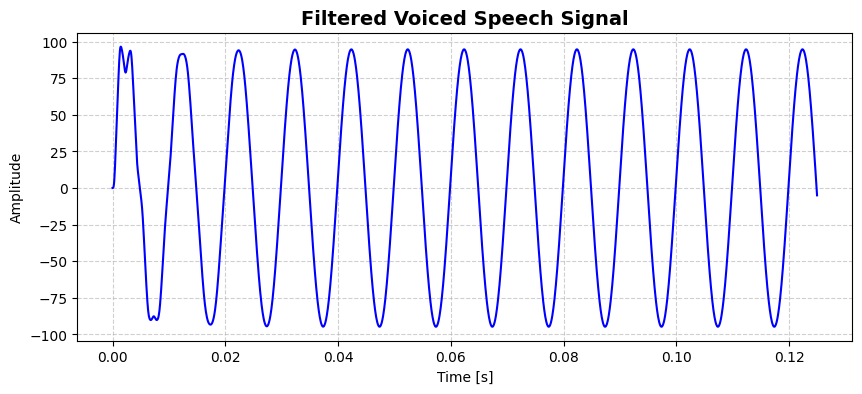

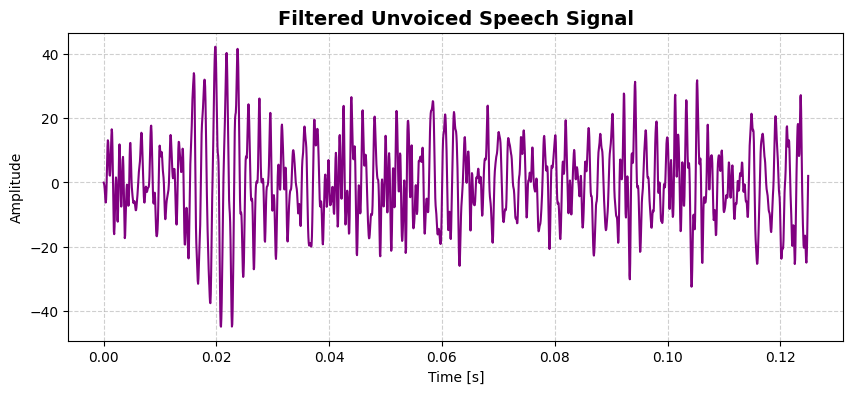

In [ ]:
# Example formants (Hz) typical for vowels
formants = [500, 1500, 2500]
bandwidths = [50, 70, 100]

# Compute all-pole filter denominator 'a'
a = np.array([1.0])
for f, bw in zip(formants, bandwidths):
    r = np.exp(-np.pi * bw / fs)
    theta = 2 * np.pi * f / fs
    section = np.array([1, -2*r*np.cos(theta), r**2])  # denominator of biquad
    a = np.convolve(a, section)  # cascade the sections

# Apply filter
speech_voiced = lfilter([1.0], a, source_voiced)
speech_unvoiced = lfilter([1.0], a, source_unvoiced)

# Plot first few ms (to avoid long signals looking messy)
plot_signal(t[:2000], speech_voiced[:2000], "Filtered Voiced Speech Signal", color='blue')
plot_signal(t[:2000], speech_unvoiced[:2000], "Filtered Unvoiced Speech Signal", color='purple')

# Listen
display(play_audio(speech_voiced, fs, "Voiced Speech"))
display(play_audio(speech_unvoiced, fs, "Unvoiced Speech"))


Sampling Rate: 8000 Hz
MSE (Zero-order Hold): 3.474464
MSE (Linear Interpolation): 0.002373


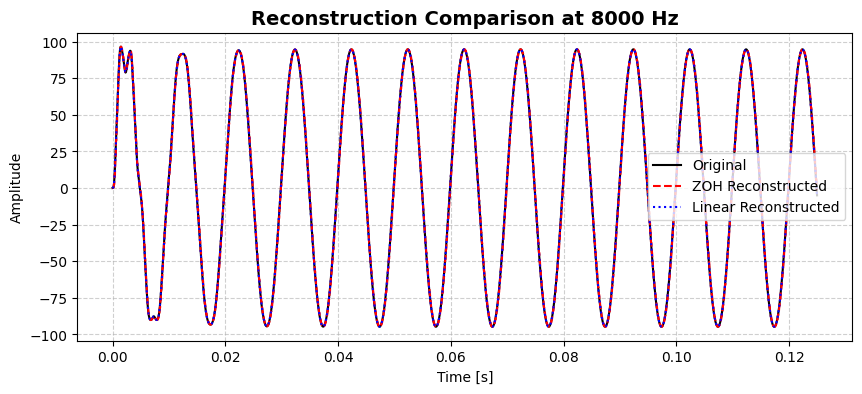


Sampling Rate: 16000 Hz
MSE (Zero-order Hold): 0.000000
MSE (Linear Interpolation): 0.000000


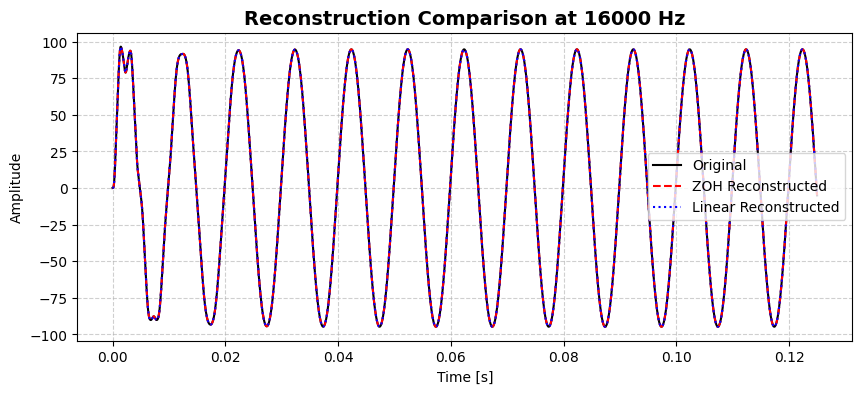


Sampling Rate: 44100 Hz
MSE (Zero-order Hold): 0.304655
MSE (Linear Interpolation): 0.000053


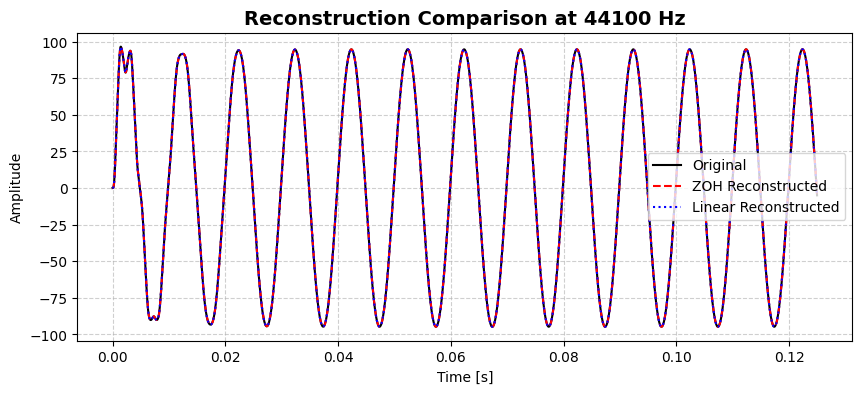

In [ ]:
sampling_rates = [8000, 16000, 44100]
speech = speech_voiced
original_time = t

for sr in sampling_rates:
    if sr <= fs:
        step = int(fs / sr)
        sampled_signal = speech[::step]
        sampled_time = original_time[::step]
    else:
        sampled_time = np.linspace(original_time[0], original_time[-1], int(len(original_time) * sr / fs))
        sampled_signal = np.interp(sampled_time, original_time, speech)

    # Reconstruction
    zoh_reconstructed = zero_order_hold(original_time, sampled_time, sampled_signal)
    lin_reconstructed = linear_interpolation(original_time, sampled_time, sampled_signal)

    # MSE
    mse_zoh = mean_squared_error(speech, zoh_reconstructed)
    mse_lin = mean_squared_error(speech, lin_reconstructed)

    print(f"\nSampling Rate: {sr} Hz")
    print(f"MSE (Zero-order Hold): {mse_zoh:.6f}")
    print(f"MSE (Linear Interpolation): {mse_lin:.6f}")

    # Plot with different colors
    plt.figure(figsize=(10, 4))
    plt.plot(original_time[:2000], speech[:2000], label="Original", color='black', linewidth=1.5)
    plt.plot(original_time[:2000], zoh_reconstructed[:2000], label="ZOH Reconstructed", color='red', linestyle='--')
    plt.plot(original_time[:2000], lin_reconstructed[:2000], label="Linear Reconstructed", color='blue', linestyle=':')
    plt.title(f"Reconstruction Comparison at {sr} Hz", fontsize=14, fontweight='bold')
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

    # Listen
    display(play_audio(zoh_reconstructed, fs, f"Reconstructed (ZOH) {sr} Hz"))
    display(play_audio(lin_reconstructed, fs, f"Reconstructed (Linear) {sr} Hz"))


##Inference

1. **Source-Filter Model**  
   - The source generates either periodic impulses (voiced sounds) or noise (unvoiced sounds).  
   - The vocal tract filter shapes this into realistic speech-like sounds by introducing formants.  

2. **Effect of Filtering**  
   - Without filtering, the source is unnatural (impulses/noise).  
   - Filtering introduces resonances (formants), giving speech its characteristic quality.  

3. **Sampling Rates**  
   - At **8 kHz**, quality drops with noticeable distortion but speech remains intelligible.  
   - At **16 kHz**, good balance of clarity and efficiency.  
   - At **44.1 kHz**, closest to the original with minimal error.  

4. **Reconstruction Methods**  
   - **Zero-order hold** produces blocky, unnatural signals.  
   - **Linear interpolation** is smoother and has lower MSE.  

5. **Conclusion**  
   - Higher sampling rates and linear interpolation preserve quality.  
   - The experiment validates the Source-Filter theory and demonstrates the trade-off between sampling rate and quality.
